### Content Analysis Community Pages - Inmigration Posts
### Topic Modeling 

In [1]:
import re
import numpy as np
import pandas as pd
from pprint import pprint
from collections import Counter

# Gensim
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel

# Plotting tools
import pyLDAvis
import pyLDAvis.gensim  # don't skip this
import matplotlib.pyplot as plt

#TF-IDF
from sklearn.feature_extraction.text import TfidfTransformer,CountVectorizer

# spacy for lemmatization
import spacy

#nltk
from nltk.corpus import stopwords

# Enable logging for gensim - optional
import logging
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.ERROR)

import warnings
warnings.filterwarnings("ignore",category=DeprecationWarning)

In [2]:
def clean_address(row):
    name =  row.lower().split('/')
    if  row.lower().startswith('https') or  row.lower().startswith('http'):       
        return name[3]
    elif row.lower().startswith('www'):
        return name[1] 
    elif row.lower().startswith('facebook'):
        return name[1]
    else:
        print("Not found", row)
        return None

## 1. Reads  Info
Reads the information from all the posts from the studied period

In [3]:
import os
os.getcwd()

'/home/claudia/Documents/Latinx2020'

In [4]:

#path = "Latinx2020/"
posts = pd.read_csv("community/FB_groups_States_economy.csv")
#We rename the colum Page Name to be able to concat with Group Posts
posts.rename(columns={'Page Name':'Group Name'}, inplace=True)
posts.shape

(12308, 39)

In [5]:
posts['URL']

0        https://www.facebook.com/groups/79341620735648...
1        https://www.facebook.com/groups/79341620735648...
2        https://www.facebook.com/groups/79341620735648...
3        https://www.facebook.com/groups/79341620735648...
4        https://www.facebook.com/groups/79341620735648...
                               ...                        
12303    https://www.facebook.com/vargarte/posts/140585...
12304    https://www.facebook.com/1001653156892562/post...
12305    https://www.facebook.com/latinosover40newyork/...
12306    https://www.facebook.com/latinosover40newyork/...
12307    https://www.facebook.com/latinosover40newyork/...
Name: URL, Length: 12308, dtype: object

## 9. Filter the most relevant columns
### Add column to concat Message, Description, Link Text

In [6]:
concat_message = posts['Message'].fillna('') + (' ' + posts['Description']).fillna('')+ (' ' + posts['Link Text']).fillna('') + (' ' + posts['Link']).fillna('')
posts['MessageDescr'] = concat_message

concat_just_message = posts['Message'].fillna('') + (' ' + posts['Description']).fillna('')+ (' ' + posts['Link Text']).fillna('')
posts['MessageOnly'] = concat_just_message

In [7]:
posts.columns

Index(['Unnamed: 0', 'name', 'Page or Account URL', 'List', 'State', 'state',
       'Facebook Id', 'Group Name', 'User Name', 'Likes at Posting', 'Created',
       'Type', 'Likes', 'Comments', 'Shares', 'Love', 'Wow', 'Haha', 'Sad',
       'Angry', 'Care', 'Video Share Status', 'Post Views', 'Total Views',
       'Total Views For All Crossposts', 'Video Length', 'URL', 'Message',
       'Link', 'Final Link', 'Image Text', 'Link Text', 'Description',
       'Sponsor Id', 'Sponsor Name', 'Total Interactions',
       'Overperforming Score', 'MessageDescr', 'MessageOnly'],
      dtype='object')

In [8]:
posts["Created"].head(5)

0    2020-08-25 19:22:55 EDT
1    2020-08-18 20:49:59 EDT
2    2020-08-18 17:08:28 EDT
3    2020-08-30 23:49:31 EDT
4    2020-08-27 17:19:23 EDT
Name: Created, dtype: object

In [9]:
posts['converted_date'] = pd.to_datetime(posts["Created"])
posts['converted_date']

0       2020-08-25 19:22:55-04:00
1       2020-08-18 20:49:59-04:00
2       2020-08-18 17:08:28-04:00
3       2020-08-30 23:49:31-04:00
4       2020-08-27 17:19:23-04:00
                   ...           
12303   2020-09-06 12:52:04-04:00
12304   2020-10-30 21:31:14-04:00
12305   2020-09-24 09:38:22-04:00
12306   2020-09-23 15:38:04-04:00
12307   2020-09-16 16:38:22-04:00
Name: converted_date, Length: 12308, dtype: datetime64[ns, tzlocal()]

In [10]:
posts['converted_date']=posts['converted_date'].dt.date

In [11]:
import seaborn as sns
pd.set_option('display.max_rows', None)
group_date = posts.groupby('converted_date').agg({'Facebook Id':'count'}).reset_index().rename(columns={'Facebook Id':'count'})
group_date


,converted_date,count
0,2020-08-18,184
1,2020-08-19,159
2,2020-08-20,161
3,2020-08-21,107
4,2020-08-22,107
5,2020-08-23,98
6,2020-08-24,192
7,2020-08-25,213
8,2020-08-26,156
9,2020-08-27,178


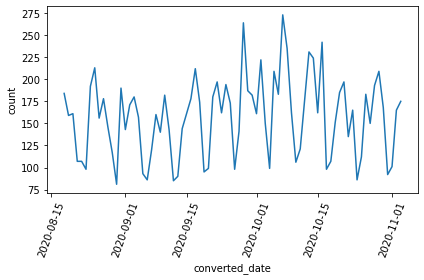

In [12]:
sns.lineplot(data=group_date, x='converted_date', y='count')
plt.xticks(rotation=70)
plt.tight_layout()

In [13]:
posts[posts['Link Text'].str.lower().str.contains("í", na = False)].head(1)

,Unnamed: 0,name,Page or Account URL,List,State,state,Facebook Id,Group Name,User Name,Likes at Posting,...,Image Text,Link Text,Description,Sponsor Id,Sponsor Name,Total Interactions,Overperforming Score,MessageDescr,MessageOnly,converted_date
9,1854,Hispanos unidos en New York (H.U.N.Y),https://www.facebook.com/groups/793416207356486,Latinos+EstadosGroups,New York,New York,793416207356486,Hispanos unidos en New York (H.U.N.Y),NaN,6299.0,...,NaN,Extraen úteros a inmigrantes bajo custodia de ...,**Más inmigrantes denuncian más cirugías innec...,NaN,NaN,0,-136.0,Más inmigrantes denuncian cirugías innecesaria...,Más inmigrantes denuncian cirugías innecesaria...,2020-09-18


In [14]:
#!/usr/bin/env python
import re

text = u'This is a smiley face \U0001f602'
print(text) # with emoji

def deEmojify(text):
    
    regrex_pattern = re.compile(pattern = "["
        u"\U0001F600-\U0001F64F"  # emoticons
        u"\U0001F300-\U0001F5FF"  # symbols & pictographs
        u"\U0001F680-\U0001F6FF"  # transport & map symbols
        u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
                          
                           "]+", flags = re.UNICODE)
    
    
    return regrex_pattern.sub(r'',text)

print(deEmojify(text))

def deEmojify(inputString):
    return inputString.encode('ascii', 'ignore').decode('ascii')

This is a smiley face 😂
This is a smiley face 


In [15]:

posts['Group Name']=posts['Group Name'].apply(deEmojify)
posts['Group Name']=posts['Group Name'].apply(lambda i: i.replace('"', ''))
posts['Group Name']=posts['Group Name'].apply(lambda i: i.replace(',', ''))
posts['Facebook Id'] = posts['Facebook Id'].astype(int)



### 4. US states

In [16]:
us_states = pd.DataFrame({'State':['Alabama','Alaska','Arizona','Arkansas','California','Colorado','Connecticut','Delaware','District of Columbia','Florida',
             'Georgia','Hawaii','Idaho','Illinois','Indiana','Iowa','Kansas','Kentucky','Louisiana','Maine','Maryland','Massachusetts',
             'Michigan','Minnesota','Mississippi','Missouri','Montana','Nebraska','Nevada','New Hampshire','New Jersey','New Mexico',
             'New York','North Carolina','North Dakota','Ohio','Oklahoma','Oregon','Pennsylvania','Rhode Island','South Carolina',
             'South Dakota','Tennessee','Texas','Utah','Vermont','Virginia','Washington','West Virginia','Wisconsin','Wyoming']})

##  Count posts in general by state

In [17]:

df_count = posts.groupby(['State']).agg({'Facebook Id':'count'}).reset_index() 

df_count.columns = ['State','Posts_Counts']
df_count.sort_values(by=['State'], ascending=True,inplace=True)
df_count.fillna(0, inplace=True)
df_count['Posts_Counts'] = df_count['Posts_Counts'].astype(int)
df_count.head(10)



,State,Posts_Counts
0,Arizona,19
1,Arkansas,1
2,California,493
3,Colorado,67
4,Connecticut,102
5,Florida,4773
6,Georgia,464
7,Illinois,318
8,Indiana,1
9,Iowa,5


In [18]:
#us_states['State'] = us_states['State']
from functools import reduce
data_frames = [df_count, us_states]
missing_states  = reduce(lambda  left,right: pd.merge(left,right,on=['State'],
                                            how='outer'), data_frames)
missing_states.fillna(0, inplace=True)
missing_states['Posts_Counts'] = missing_states['Posts_Counts'].astype(int)
missing_states

,State,Posts_Counts
0,Arizona,19
1,Arkansas,1
2,California,493
3,Colorado,67
4,Connecticut,102
5,Florida,4773
6,Georgia,464
7,Illinois,318
8,Indiana,1
9,Iowa,5


## 3. Which groups are publishing the majority of the content

In [19]:
group = posts.groupby(['Group Name'])
final_groups = group.agg({'Facebook Id':'count'}).sort_values(by='Facebook Id',ascending=False)
final_groups

,Facebook Id
Group Name,
LATINOS EN NEW YORK,737
Venezolanos en Miami,493
Cubanos en miamifl,272
Venezolanos en La Florida,270
Latinos en New Jersey (NJ) y New York (NY),250
Venezolanos En Orlando,230
Latinos en Florida Broward & Miami Dade,220
Venezolanos en Florida.,219
Boricuas en Orlando VIP,214


## Tokenize words and Clean-up text

In [20]:
content = posts.copy()
content['MessageDescr']

0        Estamos en vivo! Conéctate a nuestro programa,...
1         🐝JAFRA🐝\n\n🦋🦋🦋🦋Quieres unirte🦋🦋🦋\nEl momento ...
2         📺WATCH: “Many of us here are Mixtecs. We pay ...
3        OFREZCO EMPLEO ¿Te interesan los deportes y la...
4        Se acerca la fecha para tu examen de carretera...
5        Por QueensLatino Durante el pico de la pandemi...
6        Evite una auditoría del IRS Cada año, el Servi...
7         Despídete de la pobreza Carlos Marquez https:...
8        Excellent one family house located in Woodhave...
9        Más inmigrantes denuncian cirugías innecesaria...
10       IRS les recuerda a contribuyentes que solicita...
11        ✔TEMA DEL DÍA: FINANZAS AL DIA, ¿CÓMO ESTÁ AF...
12        ✔TEMA DEL DÍA: FINANZAS AL DIA, ¿CÓMO ESTÁ AF...
13       Seis consejos para contribuyentes que empiezan...
14        Donald Trump no pagó impuestos federales sobr...
15       Es VIERNES de HABLEMOS DE REAL ESTATE el SHOW ...
16       **El Pdte. Trump NO pagó impuestos en 10 de lo.

In [21]:
content['cleanMessage'] = content['MessageDescr'].apply(lambda x: re.split('https:\/\/.*', str(x))[0])
content['cleanMessage'].shape

(12308,)

In [22]:
# Convert to list
data = content.cleanMessage.tolist()

In [23]:
# Remove new line characters
data = [re.sub('\s+', ' ', sent) for sent in data]

# Remove distracting single quotes
data = [re.sub("\'", "", sent) for sent in data]


In [24]:
def sent_to_words(sentences):
    for sentence in sentences:
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))  # deacc=True removes punctuations

data_words = list(sent_to_words(data))

print(data_words[:2])

[['estamos', 'en', 'vivo', 'conectate', 'nuestro', 'programa', 'hoy', 'hablaremos', 'sobre', 'que', 'hacer', 'si', 'tengo', 'un', 'accidente', 'que', 'cubre', 'el', 'seguro', 'que', 'debo', 'hacer', 'sales', 'taxes', 'se', 'acerca', 'septiembre', 'necesitamos', 'saber', 'mas', 'sobre', 'los', 'sales', 'taxes', 'conectate'], ['jafra', 'quieres', 'unirte', 'el', 'momento', 'de', 'unirse', 'jafra', 'te', 'ofrece', 'sitio', 'web', 'gratis', 'por', 'unicamente', 'impuestos', 'para', 'inscribirse', 'pero', 'recibes', 'productos', 'con', 'valor', 'de', 'dolares', 'tu', 'paquete', 'de', 'inicio', 'para', 'nueva', 'consultora', 'con', 'valor', 'de', 'dolares', 'solo', 'tax', 'envio', 'productos', 'gratis', 'en', 'los', 'primeros', 'meses', 'de', 'tu', 'inscripcion', 'productos', 'regalos', 'exclusivos', 'por', 'ser', 'frecuente', 'en', 'tus', 'ordenes', 'si', 'deseas', 'mas', 'informacion', 'enviame', 'un', 'mensaje', 'nieves', 'ojendiz', 'consultura', 'independiente', 'jafra']]


#### Creating Bigram and Trigram Models

In [25]:
# Build the bigram and trigram models
bigram = gensim.models.Phrases(data_words, min_count=5, threshold=100) # higher threshold fewer phrases.
trigram = gensim.models.Phrases(bigram[data_words], threshold=100)  

# Faster way to get a sentence clubbed as a trigram/bigram
bigram_mod = gensim.models.phrases.Phraser(bigram)
trigram_mod = gensim.models.phrases.Phraser(trigram)

# See trigram example
print(trigram_mod[bigram_mod[data_words[0]]])

['estamos', 'en', 'vivo', 'conectate', 'nuestro', 'programa', 'hoy', 'hablaremos', 'sobre', 'que', 'hacer', 'si', 'tengo', 'un', 'accidente', 'que', 'cubre', 'el', 'seguro', 'que', 'debo', 'hacer', 'sales', 'taxes', 'se', 'acerca', 'septiembre', 'necesitamos', 'saber', 'mas', 'sobre', 'los', 'sales', 'taxes', 'conectate']


## Remove Stopwords, Make Bigrams and Lemmatize

In [26]:
#import nltk
#nltk.download('stopwords')
stop_words = stopwords.words('spanish')
stop_words.extend(stopwords.words('english'))
stop_words.extend(['su','sus','al','de','en','el','tal','con','mas','si','dos','pm','ser','ex','could','like','would','get','many','much','\ufeff1'])

In [27]:
# Define functions for stopwords, bigrams, trigrams and lemmatization
def remove_stopwords(texts):
    return [[word for word in simple_preprocess(str(doc)) if word not in stop_words] for doc in texts]

def make_bigrams(texts):
    return [bigram_mod[doc] for doc in texts]

def make_trigrams(texts):
    return [trigram_mod[bigram_mod[doc]] for doc in texts]

def lemmatization(texts, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV']):
    """https://spacy.io/api/annotation"""
    texts_out = []
    for sent in texts:
        doc = nlp(" ".join(sent)) 
        texts_out.append([token.lemma_ for token in doc if token.pos_ in allowed_postags])
    return texts_out

In [28]:
# Remove Stop Words
data_words_nostops = remove_stopwords(data_words)

# Form Bigrams
data_words_bigrams = make_bigrams(data_words_nostops)

# Initialize spacy 'en' model, keeping only tagger component (for efficiency)
#https://stackoverflow.com/questions/54334304/spacy-cant-find-model-en-core-web-sm-on-windows-10-and-python-3-5-3-anacon
#!python3 -m spacy download es_core_news_sm
#!python -m spacy download es
nlp = spacy.load('es', disable=['parser', 'ner'])

# Do lemmatization keeping only noun, adj, vb, adv
data_lemmatized = lemmatization(data_words_bigrams, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV'])


In [29]:
print(data_words_nostops[1:2])

[['jafra', 'quieres', 'unirte', 'momento', 'unirse', 'jafra', 'ofrece', 'sitio', 'web', 'gratis', 'unicamente', 'impuestos', 'inscribirse', 'recibes', 'productos', 'valor', 'dolares', 'paquete', 'inicio', 'nueva', 'consultora', 'valor', 'dolares', 'solo', 'tax', 'envio', 'productos', 'gratis', 'primeros', 'meses', 'inscripcion', 'productos', 'regalos', 'exclusivos', 'frecuente', 'ordenes', 'deseas', 'informacion', 'enviame', 'mensaje', 'nieves', 'ojendiz', 'consultura', 'independiente', 'jafra']]


## Bag of Words

In [30]:
def combine_words(word1,word2,dictionary):

    if word1 in dictionary and word2 in dictionary:
        concat_name = word1+" / "+word2
        dictionary[concat_name] = dictionary[word1] + dictionary[word2]
        dictionary.pop(word1, None)
        dictionary.pop(word2, None)
        result = dictionary.pop(word1, None)
        result = dictionary.pop(word2, None)
    return dictionary

In [31]:
flat_list_words = [item for sublist in data_lemmatized for item in sublist]
count_words = Counter(flat_list_words)

In [32]:
final_dict = combine_words('donald','trump',count_words)
final_dict = combine_words('joe','biden',count_words)
final_dict = combine_words('kamala','harris',count_words)
final_dict = combine_words('american','america',count_words)
final_dict = combine_words('estados','unidos',count_words)
final_dict = combine_words('voters','vote',count_words)
final_dict = combine_words('mexico','mexican',count_words)
final_dict = combine_words('casa','blanca',count_words)
final_dict = combine_words('venezuela','venezuelans',count_words)
final_dict = combine_words('latino','latinos',count_words)
final_dict = combine_words('american / america','americans',count_words)
final_dict = combine_words('voters / vote','voting',count_words)
final_dict = combine_words('puerto','rico',count_words)
final_dict = combine_words('communism','communist',count_words)
final_dict = combine_words('ee','uu',count_words)
final_dict = combine_words('united','states',count_words)
final_dict = combine_words('president','presidente',count_words)
final_dict = combine_words('democrat','democrats',count_words)
final_dict = combine_words('informacion','informar',count_words)
final_dict = combine_words('covid','coronavirus',count_words)
final_dict = combine_words('democrat / democrats','democratas',count_words)

In [33]:
final_dict.most_common(1000)

[('emplear', 4596),
 ('impuesto', 3982),
 ('trabajar', 3730),
 ('ano', 2165),
 ('oportunidad', 2096),
 ('hacer', 2083),
 ('tener', 2066),
 ('pagar', 2041),
 ('personar', 2035),
 ('casar', 1842),
 ('solo', 1752),
 ('poder', 1696),
 ('buscar', 1529),
 ('necesitar', 1501),
 ('seguro', 1405),
 ('tiempo', 1349),
 ('contar', 1316),
 ('ayudar', 1295),
 ('negociar', 1252),
 ('querer', 1245),
 ('hoy', 1227),
 ('nuevo', 1220),
 ('dinero', 1209),
 ('dolar', 1202),
 ('ofertar', 1199),
 ('servicio', 1112),
 ('experiencia', 1097),
 ('mejor', 1019),
 ('llamar', 1016),
 ('personal', 1015),
 ('tambien', 1014),
 ('ofrecer', 1007),
 ('decir', 1006),
 ('taxes', 999),
 ('semana', 984),
 ('vida', 957),
 ('trump', 951),
 ('hora', 939),
 ('ahora', 928),
 ('venta', 913),
 ('partir', 898),
 ('ganar', 896),
 ('president / presidente', 887),
 ('usar', 886),
 ('numerar', 884),
 ('obtener', 882),
 ('empresa', 876),
 ('clase', 870),
 ('encontrar', 854),
 ('ingreso', 849),
 ('cursar', 810),
 ('gran', 796),
 ('salud',

In [34]:
docs = ([' '.join(ele) for ele in data_lemmatized] )


In [35]:
cv=CountVectorizer() 
word_count_vector=cv.fit_transform(docs)
#word_count_vector.toarray()

# Convert bow_matrix into a DataFrame
bow_df = pd.DataFrame(word_count_vector.toarray())

# Map the column names to vocabulary 
bow_df.columns = cv.get_feature_names()

# Print bow_df
#print(bow_df)

In [36]:
tfidf_transformer=TfidfTransformer(smooth_idf=True,use_idf=True) 
tfidf_transformer.fit(word_count_vector)

TfidfTransformer()

In [37]:
# print idf values 
df_idf = pd.DataFrame(tfidf_transformer.idf_, index=cv.get_feature_names(),columns=["idf_weights"]) 
 
# sort ascending 
df_idf.sort_values(by=['idf_weights'])

,idf_weights
emplear,2.097638
trabajar,2.575807
impuesto,2.642810
oportunidad,2.938222
tener,3.106868
hacer,3.133265
pagar,3.165324
ano,3.171005
personar,3.171718
buscar,3.205792


In [38]:
# count matrix 
count_vector=cv.transform(docs) 
 
# tf-idf scores 
tf_idf_vector=tfidf_transformer.transform(count_vector)

In [39]:
feature_names = cv.get_feature_names() 
 
#get tfidf vector for first document 
first_document_vector=tf_idf_vector[0] 
 
#print the scores 
df = pd.DataFrame(first_document_vector.T.todense(), index=feature_names, columns=["tfidf"]) 
df = df[(df != 0).all(1)]
df.sort_values(by=["tfidf"],ascending=False)

,tfidf
salir,0.431118
taxes,0.363491
accidentar,0.352780
hacer,0.316535
cubrir,0.290204
acercar,0.273479
septiembre,0.245163
programar,0.236147
saber,0.212731
vivir,0.205796


In [40]:
pd.set_option('display.max_colwidth',None)
#word = df.index[8]
word = r"\b(taxes)\b"
content["lowercase"] = content['MessageOnly'].apply(lambda x: x.lower())
word_messages = content[content['lowercase'].str.contains(word)]
word_messages = word_messages['lowercase'].value_counts(ascending=False).rename_axis('unique_messages').reset_index(name='counts')

word_messages

/home/claudia/anaconda3/lib/python3.8/site-packages/pandas/core/strings.py:1954: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  return func(self, *args, **kwargs)


,unique_messages,counts
0,"📣cursos! tax preparer preparador de taxes con créditos ante el irs. fecha: sábado 10 de octubre 2020 desde las 10:00 am hasta las 5:00 pm. . 5 sábados consecutivos. 30 horas académicas! contenido: . ✅conoce la planilla 1040. ✅identifica los tipos de ingresos. ✅conoce los gastos permitidos. ✅obligaciones del contribuyente. ✅obligaciones del preparador, entre otros.... . contáctanos! somos b&j consulting group, llc orlando, florida sigue nuestra cuenta @bandjcg . ☎4074524115 / 4074536726 #tax #taxpreparers2020 #2020taxes #taxpreparerscertified",73
1,"📣último curso de taxes del 2020!📣 tax school! ya puedes inscribirte contactando a los números 407-452 4115 / 407-453 6726. 5 jueves consecutivos. clases presenciales. desde las 10:00 am hasta las 5:00 pm. inicio: 19 de noviembre 2020. culmina: 17 de diciembre 2020. 30 horas académicas. ✅obtienes 15 créditos por educación para este año 2020. ✅obtienes el ptin. ✅obtienes certificado para la tax season 2021. ✅libros bilingües. ✅software demo para prácticas. ✅exámenes en inglés o en español. aprende sobre los elementos que debes tener en cuenta al momento de elaborar una declaración de taxes personales! somos b&j consulting group, llc 1650 sand lake road suite 225, orlando, florida 32809 #tax #taxpreparer #taxpreparerscertified #lastchance2020 #entrepreneur #entrepreneurlife",46
2,"trabajas mucho y de lo que ganas no puedes pagar tus facturas,te sientes estresado(a) entonces llegó la tu solución suya (resuelve tu deuda)nosotros nos encargamos de ayudarte a pagar tus facturas atrasada sin dinero por adelantado,sin crédito no importa la cantidad de tu deuda somos tu solución puede ser factura de luz,agua,troca,carro,aseguranza, placas,cable,internet, teléfono de casa ,teléfono móvil,multas ,taxes y más pagamos todos a mitad de precio que es el 50% necesitas ayuda enviame mensaje privado persona interesada porfavor por más informaciónes inbox desde y verás como le daremos una solución más rápido posible.",29
3,"trabajas mucho y de lo que ganas no puedes pagar tus facturas,te sientes estresado(a) entonces llegó la tu solución suya (resuelve tu deuda)nosotros nos encargamos de ayudarte a pagar tus facturas atrasada sin dinero por adelantado,sin crédito no importa la cantidad de tu deuda somos tu solución puede ser factura de luz,agua,troca,carro,aseguranza, placas,cable,internet, teléfono de casa ,teléfono móvil,multas ,taxes y más pagamos todos a mitad de precio que es el 50% necesitas ayuda enviame mensaje privado persona interesada porfavor por más informaciónes inbox desde ahora y verás como le daremos una solución más rápido posible.",20
4,"empieze su propio negocio, conviértase en un experto en impuestos. curso integral taxes personales, taxes corporativos y formas de inmigración. desde octubre 12 a octubre 17 de 9:00 am a 3:00 pm. se proveerá almuerzo. prepárese para la campaña 2021. inscribase al numero whatsapp 407-764-8744.",18
5,"capacitate y registrate ✔✔✔en nuestros curso 💻 en línea y empieza a ganar esta temporada de taxes 2020!! 🌀curso de preparación de impuestos (taxes 2020) , 100% en línea. 👉clases teórico- prácticas 👉duración : 4 semanas 👉costo $199 👉material de estudio 👉videos interactivos 👉chat bot 👉acceso al salón virtual 👉certificado de culminación 👉asesoramiento para obtener tu número de preparador de impuestos (ptin) certificado por el irs. preparate para ganar con nuestra ayuda tu también puedes! en los 50 estados de la nación!! registrate ahora!! llama a nuestros números para más información: 📞(407)674-6000 (407)414-4417 o escríbenos por whatsapp al 📲(407)414-4417 📲(407)444-1366 📩bdntaxservices@gmail.com 📌9251 s. orange blossom trl, 4, orlando fl,32837. bib plaza",17
6,servi taxes,15
7,¿quiere ganar dinero? conviértase en un preparador de taxes. le ofrecemos un webinario gratuito. sábado octubre 3 por la mañana y por la tarde. temas a tratar: de 9:00 am a 11:30 am taxes personales. de 12:30 pm a 3:00 pm taxes corpora

### Repeated messages

In [41]:
content['Total Interactions']=content['Total Interactions'].astype(str).str.replace(',', '').astype(int)
results = content.groupby(['MessageDescr','Link']).aggregate({'MessageDescr': 'count','Likes': 'sum','Comments': 'sum', 'Shares': 'sum', 'Love': 'sum', 'Wow': 'sum', 'Haha': 'sum', 'Sad': 'sum',
       'Angry': 'sum', 'Care': 'sum','Total Interactions':'sum'})
results.rename(columns={"MessageDescr": "Counts"}, inplace=True)

#results.to_csv("mostpopularNewsMedia.csv")

In [42]:
##results.sort_values(by='Counts',ascending=False)

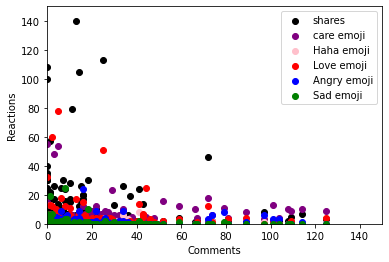

In [43]:
results.reset_index()
plt.xlim(0,150)
plt.ylim(0,150)

plt.xlabel('Comments')
plt.ylabel('Reactions')
plt.scatter(results.Comments, results.Shares,c='black',label='shares')
plt.scatter(results.Comments, results.Haha,c='purple',label='care emoji')
plt.scatter(results.Comments, results.Wow,c='pink',label='Haha emoji')
plt.scatter(results.Comments, results.Love,c='red',label='Love emoji')
plt.scatter(results.Comments, results.Angry,c='blue',label='Angry emoji')
plt.scatter(results.Comments, results.Sad,c='green',label='Sad emoji')

plt.legend()


## Topic Modeling
### Create the Dictionary and Corpus needed for Topic Modeling

In [44]:


# Create Dictionary
id2word = corpora.Dictionary(data_lemmatized)

# Create Corpus
texts = data_lemmatized

# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]

# View
print(corpus[:1])

# Human readable format of corpus (term-frequency)
[[(id2word[id], freq) for id, freq in cp] for cp in corpus[:1]]

[[(0, 1), (1, 1), (2, 1), (3, 2), (4, 1), (5, 1), (6, 1), (7, 1), (8, 2), (9, 1), (10, 1), (11, 2), (12, 1)]]


[[('accidentar', 1),
  ('acercar', 1),
  ('cubrir', 1),
  ('hacer', 2),
  ('hoy', 1),
  ('necesitar', 1),
  ('programar', 1),
  ('saber', 1),
  ('salir', 2),
  ('seguro', 1),
  ('septiembre', 1),
  ('taxes', 2),
  ('vivir', 1)]]

## Buiding the Topic Model

In [45]:

# Build LDA model
lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=20, 
                                           random_state=100,
                                           update_every=1,
                                           chunksize=100,
                                           passes=10,
                                           alpha='auto',
                                           per_word_topics=True)

## View the topics in LDA model

In [46]:
# Print the Keyword in the 10 topics
#The weights reflect how important a keyword is to that topic.
pprint(lda_model.print_topics())
doc_lda = lda_model[corpus]

[(0,
  '0.125*"personar" + 0.107*"ano" + 0.103*"casar" + 0.077*"tiempo" + '
  '0.053*"mayor" + 0.053*"ingreso" + 0.046*"programar" + 0.027*"cambiar" + '
  '0.022*"solicitar" + 0.021*"diferenciar"'),
 (1,
  '0.149*"trabajar" + 0.133*"emplear" + 0.058*"tener" + 0.055*"oportunidad" + '
  '0.047*"necesitar" + 0.031*"servicio" + 0.030*"negociar" + '
  '0.030*"experiencia" + 0.029*"ofrecer" + 0.029*"llamar"'),
 (2,
  '0.083*"aplicar" + 0.069*"pagar" + 0.061*"bueno" + 0.053*"deuda" + '
  '0.043*"multar" + 0.043*"abrir" + 0.041*"facturar" + 0.040*"preciar" + '
  '0.036*"ayudarte" + 0.036*"privar"'),
 (3,
  '0.210*"dolar" + 0.110*"beneficio" + 0.088*"directamente" + '
  '0.084*"emprendedor" + 0.081*"economia" + 0.045*"producto" + 0.043*"envio" + '
  '0.036*"tax" + 0.033*"valor" + 0.013*"sabado"'),
 (4,
  '0.306*"ofertar" + 0.073*"siguenos" + 0.066*"emprender" + 0.062*"laboral" + '
  '0.056*"diciembre" + 0.049*"meter" + 0.034*"enviar" + 0.023*"pudrir" + '
  '0.020*"disfrutar" + 0.018*"internacio

## Compute Model Perplexity and Coherence Score

In [47]:
# Compute Perplexity
print('\nPerplexity: ', lda_model.log_perplexity(corpus))  # a measure of how good the model is. lower the better.

# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=lda_model, texts=data_lemmatized, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)


Perplexity:  -17.787382626563208

Coherence Score:  0.34873497876378107


## Visualize the topics-keywords

In [48]:
# Visualize the topics
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim.prepare(lda_model, corpus, id2word)
vis

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
18    -0.300510 -0.191809       1        1  22.052868
1     -0.273701  0.192457       2        1  16.365736
0     -0.134645  0.167331       3        1   9.140059
12    -0.120549  0.173663       4        1   8.048806
6     -0.072956  0.005930       5        1   7.235040
15    -0.040232  0.068767       6        1   5.583430
7     -0.124301 -0.239428       7        1   5.255370
17     0.043931  0.009963       8        1   3.321494
14     0.050611  0.016648       9        1   2.894742
2     -0.073844 -0.191172      10        1   2.666330
5      0.074381  0.004962      11        1   2.283078
10     0.068426  0.028335      12        1   2.122010
11     0.079516 -0.007003      13        1   2.112666
3      0.096919  0.009859      14        1   1.890389
13     0.099997 -0.010647      15        1   1.866596
4      0.093047 -0.000225      16        1   1.857708
19     0.121407 -0.006965      17        1   1.796522
9      0.135847 -0.009920      18        1   1.415257
16     0.131843 -0.009130      19        1   1.179396
8      0.144813 -0.011617      20        1   0.912505, topic_info=                           Term         Freq        Total Category  logprob  \
19                     impuesto  5434.000000  5434.000000  Default  30.0000   
64                     trabajar  8824.000000  8824.000000  Default  29.0000   
53                      emplear  7866.000000  7866.000000  Default  28.0000   
59                     personar  4155.000000  4155.000000  Default  27.0000   
239                       pagar  3558.000000  3558.000000  Default  26.0000   
140                         ano  3548.000000  3548.000000  Default  25.0000   
769                     ofertar  2064.000000  2064.000000  Default  24.0000   
187                       casar  3425.000000  3425.000000  Default  23.0000   
11                        taxes  1974.000000  1974.000000  Default  22.0000   
705                      buscar  1917.000000  1917.000000  Default  21.0000   
254                       trump  1937.000000  1937.000000  Default  20.0000   
263                      ayudar  4653.000000  4653.000000  Default  19.0000   
72                       contar  2511.000000  2511.000000  Default  18.0000   
176                       tener  3427.000000  3427.000000  Default  17.0000   
296                      tiempo  2554.000000  2554.000000  Default  16.0000   
58                  oportunidad  3251.000000  3251.000000  Default  15.0000   
14                        dolar  1443.000000  1443.000000  Default  14.0000   
448                   encontrar  1268.000000  1268.000000  Default  13.0000   
3                         hacer  3592.000000  3592.000000  Default  12.0000   
165                       poder  3522.000000  3522.000000  Default  11.0000   
118                       decir  1727.000000  1727.000000  Default  10.0000   
436                       ahora  1970.000000  1970.000000  Default   9.0000   
261                      apoyar  1196.000000  1196.000000  Default   8.0000   
36                         solo  3236.000000  3236.000000  Default   7.0000   
189                     comprar  1404.000000  1404.000000  Default   6.0000   
273                  disponible  1209.000000  1209.000000  Default   5.0000   
5                     necesitar  2815.000000  2815.000000  Default   4.0000   
9                        seguro  2983.000000  2983.000000  Default   3.0000   
378                      partir  1677.000000  1677.000000  Default   2.0000   
370                       mayor  1768.000000  1768.000000  Default   1.0000   
3                         hacer  3591.138184  3592.958008   Topic1  -3.1024   
165                       poder  3520.593262  3522.413086   Topic1  -3.1223   
36                         solo  3234.852783  3236.672607   Topic1  -3.2069   
9                        seguro  2981.861572  2983.681396   Topic1  -3.2884   
34  

## Building LDA Mallet Model

In [49]:
os.getcwd()

'/home/claudia/Documents/Latinx2020'

In [50]:
# Download File: http://mallet.cs.umass.edu/dist/mallet-2.0.8.zip
from gensim.models.wrappers import LdaMallet


In [51]:
mallet_path = '/home/claudia/Documents/Latinx2020/mallet-2.0.8/bin/mallet' # update this path

In [52]:
ldamallet = gensim.models.wrappers.LdaMallet(mallet_path, corpus=corpus, num_topics=20, id2word=id2word)

In [53]:
# Show Topics
pprint(ldamallet.show_topics(formatted=False))

# Compute Coherence Score
coherence_model_ldamallet = CoherenceModel(model=ldamallet, texts=data_lemmatized, dictionary=id2word, coherence='c_v')
coherence_ldamallet = coherence_model_ldamallet.get_coherence()
print('\nCoherence Score: ', coherence_ldamallet)

[(2,
  [('impuesto', 0.15886128232827096),
   ('cursar', 0.034314036982906526),
   ('desempleo', 0.02986592107771494),
   ('hoy', 0.025735527737179895),
   ('disponible', 0.024210459426828493),
   ('clase', 0.024083370400965875),
   ('contabilidad', 0.023829192349240642),
   ('espanol', 0.01919044290525513),
   ('numerar', 0.016013217258689712),
   ('negociar', 0.015822583719895787)]),
 (17,
  [('personar', 0.03174517624231971),
   ('nuevo', 0.026840573461248247),
   ('solo', 0.021828177212460925),
   ('ano', 0.016492400560526033),
   ('hacer', 0.016061226689662606),
   ('poder', 0.014552118141640617),
   ('cubano', 0.014282634472350975),
   ('poner', 0.010294276166864288),
   ('hoy', 0.009485825158995365),
   ('llevar', 0.009270238223563652)]),
 (9,
  [('trump', 0.03828471119284461),
   ('presidente', 0.02549527710440525),
   ('decir', 0.021399314553205716),
   ('coronavirus', 0.01487921090027585),
   ('millón', 0.012371478726072055),
   ('nuevo', 0.00998913316057845),
   ('desempleo'

## Finding the optimal number of topics for LDA

In [54]:
def compute_coherence_values(dictionary, corpus, texts, limit, start=2, step=3):
    """
    Compute c_v coherence for various number of topics

    Parameters:
    ----------
    dictionary : Gensim dictionary
    corpus : Gensim corpus
    texts : List of input texts
    limit : Max num of topics

    Returns:
    -------
    model_list : List of LDA topic models
    coherence_values : Coherence values corresponding to the LDA model with respective number of topics
    """
    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        model = gensim.models.wrappers.LdaMallet(mallet_path, corpus=corpus, num_topics=num_topics, id2word=id2word)
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values


In [55]:
# Can take a long time to run.
model_list, coherence_values = compute_coherence_values(dictionary=id2word, corpus=corpus, texts=data_lemmatized, start=2, limit=40, step=6)

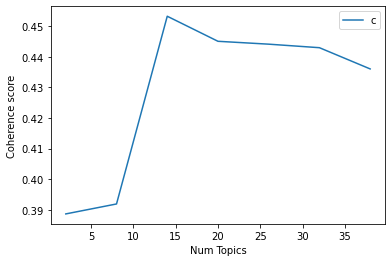

In [56]:
# Show graph
limit=40; start=2; step=6;
x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [57]:
# Print the coherence scores
for m, cv in zip(x, coherence_values):
    print("Num Topics =", m, " has Coherence Value of", round(cv, 4))

Num Topics = 2  has Coherence Value of 0.3887
Num Topics = 8  has Coherence Value of 0.3919
Num Topics = 14  has Coherence Value of 0.4532
Num Topics = 20  has Coherence Value of 0.445
Num Topics = 26  has Coherence Value of 0.4441
Num Topics = 32  has Coherence Value of 0.443
Num Topics = 38  has Coherence Value of 0.436


In [58]:
# Select the model and print the topics
optimal_model = model_list[2]
model_topics = optimal_model.show_topics(formatted=False)
pprint(optimal_model.print_topics(num_words=10))

[(0,
  '0.037*"oportunidad" + 0.034*"venta" + 0.032*"emplear" + 0.025*"trabajar" + '
  '0.020*"requerir" + 0.020*"personar" + 0.017*"solicitar" + '
  '0.017*"disponible" + 0.015*"personal" + 0.015*"cliente"'),
 (1,
  '0.012*"decir" + 0.011*"millón" + 0.010*"coronavirus" + 0.009*"aumentar" + '
  '0.008*"nacional" + 0.007*"publicar" + 0.007*"caso" + 0.007*"nuevo" + '
  '0.007*"pandemia" + 0.006*"desarrollar"'),
 (2,
  '0.031*"casar" + 0.028*"comprar" + 0.028*"desempleo" + 0.024*"nuevo" + '
  '0.013*"vivir" + 0.013*"hablar" + 0.012*"propiedad" + 0.011*"hoy" + '
  '0.011*"economia" + 0.011*"gasto"'),
 (3,
  '0.097*"tener" + 0.058*"emplear" + 0.038*"experiencia" + 0.037*"llamar" + '
  '0.032*"hora" + 0.031*"trabajar" + 0.026*"buscar" + 0.025*"ofrecer" + '
  '0.024*"semana" + 0.023*"aplicar"'),
 (4,
  '0.062*"impuesto" + 0.034*"numerar" + 0.025*"obtener" + 0.020*"iniciar" + '
  '0.017*"ahora" + 0.017*"dias" + 0.016*"numeros" + 0.016*"ano" + '
  '0.014*"clase" + 0.012*"presentar"'),
 (5,
  '0

## Finding the dominant topic in each sentence

In [59]:
def format_topics_sentences(ldamodel=lda_model, corpus=corpus, texts=data):
    # Init output
    sent_topics_df = pd.DataFrame()

    # Get main topic in each document
    for i, row in enumerate(ldamodel[corpus]):
        row = sorted(row, key=lambda x: (x[1]), reverse=True)
        # Get the Dominant topic, Perc Contribution and Keywords for each document
        for j, (topic_num, prop_topic) in enumerate(row):
            if j == 0:  # => dominant topic
                wp = ldamodel.show_topic(topic_num)
                topic_keywords = ", ".join([word for word, prop in wp])
                sent_topics_df = sent_topics_df.append(pd.Series([int(topic_num), round(prop_topic,4), topic_keywords]), ignore_index=True)
            else:
                break
    sent_topics_df.columns = ['Dominant_Topic', 'Perc_Contribution', 'Topic_Keywords']

    # Add original text to the end of the output
    contents = pd.Series(texts)
    sent_topics_df = pd.concat([sent_topics_df, contents], axis=1)
    return(sent_topics_df)


df_topic_sents_keywords = format_topics_sentences(ldamodel=optimal_model, corpus=corpus, texts=data)

# Format
df_dominant_topic = df_topic_sents_keywords.reset_index()
df_dominant_topic.columns = ['Document_No', 'Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords', 'Text']

# Show
df_dominant_topic.head(10)

,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text
0,0,7.0,0.1231,"dolar, casar, emplear, hacer, necesitar, dia, negociar, semana, viernes, solo","Estamos en vivo! Conéctate a nuestro programa, hoy hablaremos sobre: 1. Que hacer si tengo un accidente? 2. Que cubre el seguro? 3. Que debo hacer? 4. Sales Taxes, se acerca Septiembre y necesitamos saber más sobre los Sales Taxes. Conéctate!"
1,1,10.0,0.1194,"trabajar, pagar, ganar, dinero, necesitar, buscar, querer, negociar, ayudar, interesar",🐝JAFRA🐝 🦋🦋🦋🦋Quieres unirte🦋🦋🦋 El momento de unirse🎁🎁 🌹🌹🌹🌹Jafra te Ofrece🌹👋🌹 🎀🎀🎀sitio web GRATIS🎀🎀🎀 🐞Por únicamente $19 + impuestos para inscribirse! Pero recibes productos con valor de 💲6️⃣0️⃣ dólares 🟢⭐️⭐️⭐️ 🐝 tu paquete de inicio para nueva consultora con valor de 💲9️⃣5️⃣7️⃣ dólares solo $200➕tax y envío 💝 ☯️productos gratis en los primeros meses de tu inscripción 🎁🎁 🎀🎀🎀🎀Productos y regalos 🎁 exclusivos por ser frecuente en tus órdenes 🎀🎀 Si deseas más información envíame un mensaje Nieves Ojendiz Consultura Independiente Jafra
2,2,7.0,0.1445,"dolar, casar, emplear, hacer, necesitar, dia, negociar, semana, viernes, solo","📺WATCH: “Many of us here are Mixtecs. We pay our taxes. Many of our kids are citizens, but we do not get any benefits.” - Adelaida, Street Vendor Project member As we fight to #FundExcludedWorkers + #CancelRent for community members like Adelaida, today we join street vendors calling on NYC to #LiftTheCap on Permits & Pass #Intro1116 now. Make the Road New York"
3,3,10.0,0.1410,"trabajar, pagar, ganar, dinero, necesitar, buscar, querer, negociar, ayudar, interesar","OFREZCO EMPLEO ¿Te interesan los deportes y la alimentación saludable? Ofrezco a 5 nuevas personas la oportunidad de unirse a mi equipo este mes Elige tus horarios (si ya tienes un trabajo o no, no es un problema) Ven con nosotros a las convenciones (Turquía, Austria, Barcelona) ☀ (si quieres) Ahorra dinero para darte un capricho, Si esto te interesa y que quieres trabajar no solo para vivir sino también para realizar tus sueños, comenta con ""INFO"" y te explicaré todo 😉"
4,4,4.0,0.6801,"impuesto, numerar, obtener, iniciar, ahora, dias, numeros, ano, clase, presentar","Se acerca la fecha para tu examen de carretera y no cuentas con carro? o quizás tu familiar o amistad no podrá llevarte a presentar el examen? No te preocupes!!! Latinos Driving School ofrece el servicio de llevar a presentar el examen de carretera, y les recordamos que contamos con el ""PAQUETE POPULAR"" que incluye lo siguiente: PAQUETE POPULAR: $250 + taxes - cita para road test - lista y audio de comandos básicos ingles/español para entender las indicaciones del inspector al momento de presentar examen. -1 hora de conducción donde el estudiante es evaluado con el mismo sistema de puntajes que los inspectores de DMV utilizan, se corrigen los errores del estudiante y se enseña lo que el inspector quiere ver en él. Incluyendo parallel parking, broken u turn and backing up. - Adicional el estudiante al terminar la clase recibe una guía con todos los tips que debe recordar al momento de presentar su examen de carretera. - Se lleva a presentar el examen de carretera y se trae de vuelta hasta la escuela. - Clases en español o ingles. - Llevarlo a presentar examen y traerlo de vuelta Si quieras mas información en este servicio, no dudes en contactarnos lo antes posible ya que son muchos los interesados. No te quedes sin espacio y llámanos a los números 914-565-2839, 914-305-5405 y 914-305-1128 de lunes a viernes de 9am a 7pm, sábados de 9am a 3pm. Llama y reserva tu espacio! Se acerca la fecha para tu examen de carretera y no cuentas con carro? o quizás tu familiar o amistad no podrá llevarte a presentar el examen? No te preocupes!!! Latinos Driving School ofrece el servicio de llevar a presentar el examen de carretera, y les recordamos que contamos con el ""PAQUETE POPULAR"" que incluye lo siguiente: PAQUETE POPULAR: $250 + taxes - cita para road test - lista y audio de comandos básicos

## Find the most representative document for each topic

In [ ]:
#We will find the documents a given topic has contributed to the most and infer the topic by reading that document.
# Group top 5 sentences under each topic
sent_topics_sorteddf_mallet = pd.DataFrame()

sent_topics_outdf_grpd = df_topic_sents_keywords.groupby('Dominant_Topic')

for i, grp in sent_topics_outdf_grpd:
    sent_topics_sorteddf_mallet = pd.concat([sent_topics_sorteddf_mallet, 
                                             grp.sort_values(['Perc_Contribution'], ascending=[0]).head(1)], 
                                            axis=0)

# Reset Index    
sent_topics_sorteddf_mallet.reset_index(drop=True, inplace=True)

# Format
sent_topics_sorteddf_mallet.columns = ['Topic_Num', "Topic_Perc_Contrib", "Keywords", "Text"]

# Show
pd.set_option('display.max_colwidth', 400)
sent_topics_sorteddf_mallet

In [ ]:
sent_topics_sorteddf_mallet.to_csv("DominantTopicsFBGroupsStates.csv",encoding="utf-8-sig",index=False)

In [ ]:
## Topic distribution across documents
# Number of Documents for Each Topic
topic_counts = df_topic_sents_keywords['Dominant_Topic'].value_counts()

# Percentage of Documents for Each Topic
topic_contribution = round(topic_counts/topic_counts.sum(), 4)

# Topic Number and Keywords
topic_num_keywords = df_topic_sents_keywords[['Dominant_Topic', 'Topic_Keywords']]

# Concatenate Column wise
df_dominant_topics = pd.concat([topic_num_keywords, topic_counts, topic_contribution], axis=1)

# Change Column names
df_dominant_topics.columns = ['Dominant_Topic', 'Topic_Keywords', 'Num_Documents', 'Perc_Documents']

# Show
df_dominant_topics.dropna(inplace=True)
pd.set_option('display.max_colwidth', None)
df_dominant_topics